# Imports

In [1]:
import cv2
from matplotlib import pyplot as plt


# Load & Display

In [2]:
image_file = "../data/one_column.jpeg"
img = cv2.imread(image_file)
cv2.imshow("original image", img)

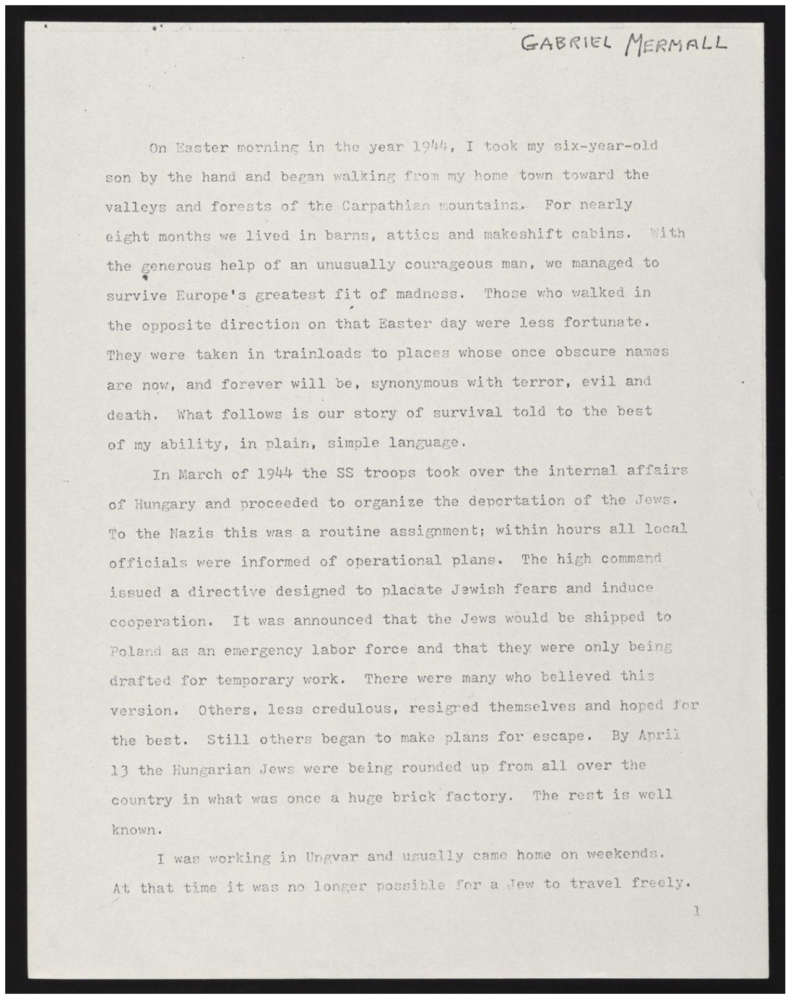

In [3]:
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()
    
display(image_file)


# Inverting 

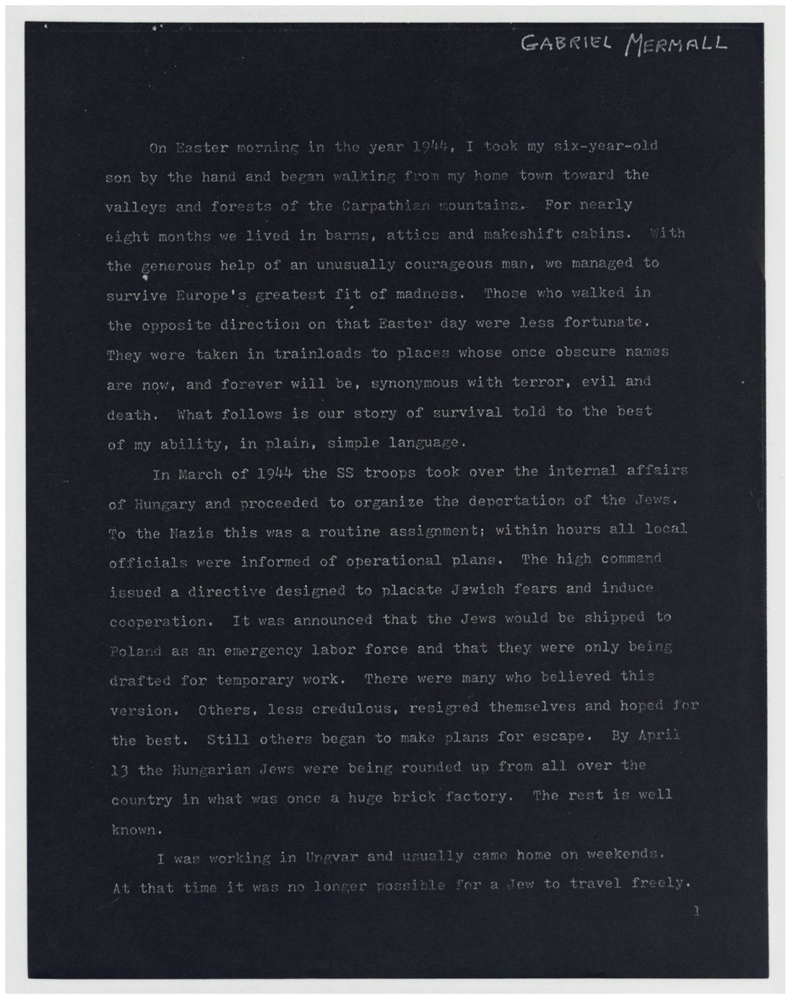

In [4]:
inverted_image = cv2.bitwise_not(img) # used for tesseract 3.x not needed 4.x
cv2.imwrite("temp/inverted.jpg", inverted_image)
display("temp/inverted.jpg")


# Rescaling 

# Binarization

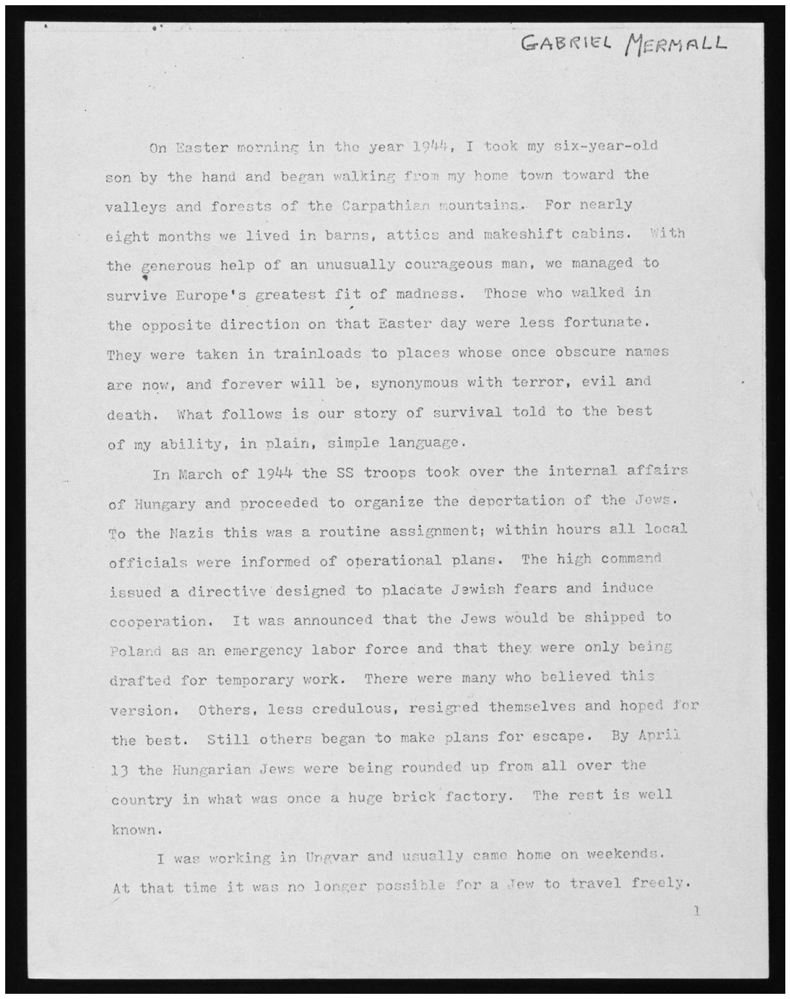

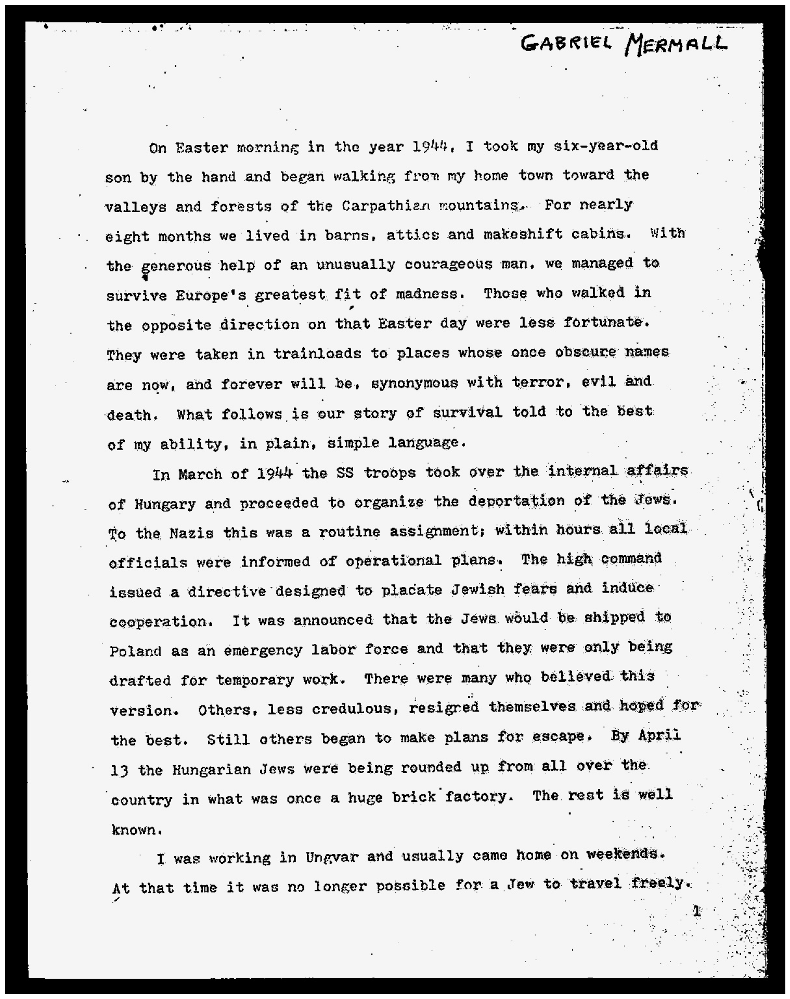

In [5]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

gray_image = grayscale(img)
cv2.imwrite("temp/gray.jpg", gray_image)
display("temp/gray.jpg")
thresh, im_bw = cv2.threshold(gray_image, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("temp/bw_image.jpg", im_bw)
display("temp/bw_image.jpg")


# Noise Removal

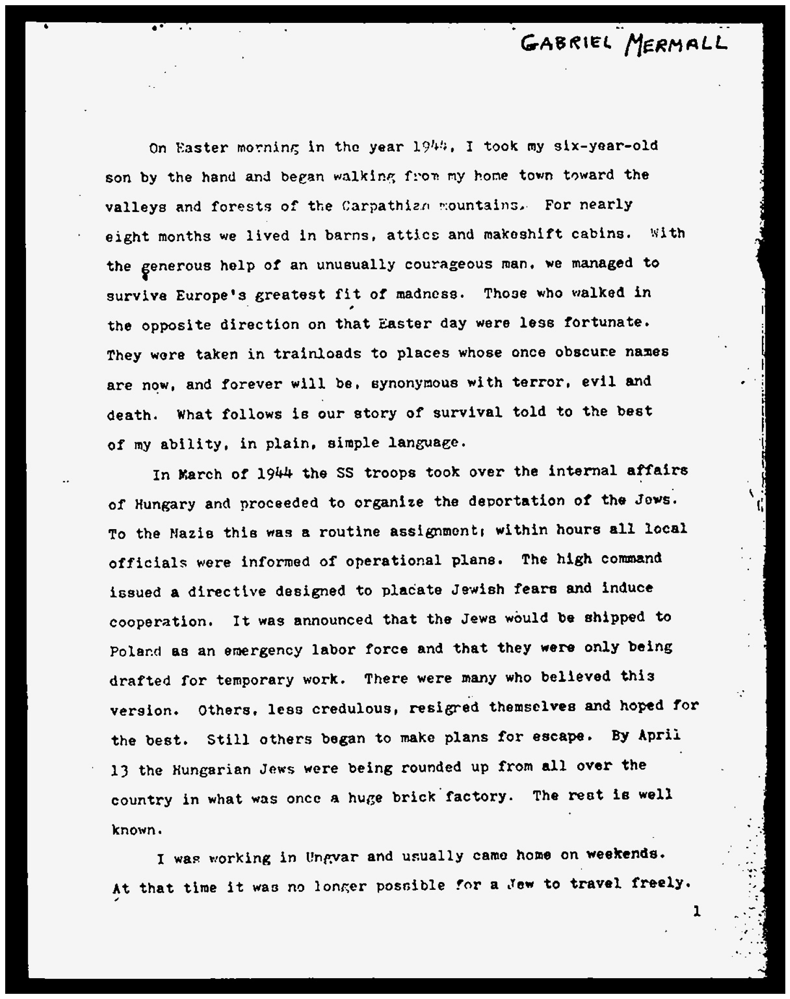

In [6]:
def noise_removal(image):
    import numpy as np
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

no_noise = noise_removal(im_bw)
cv2.imwrite("temp/no_noise.jpg", no_noise)

display("temp/no_noise.jpg")


# Dilation and Erosion

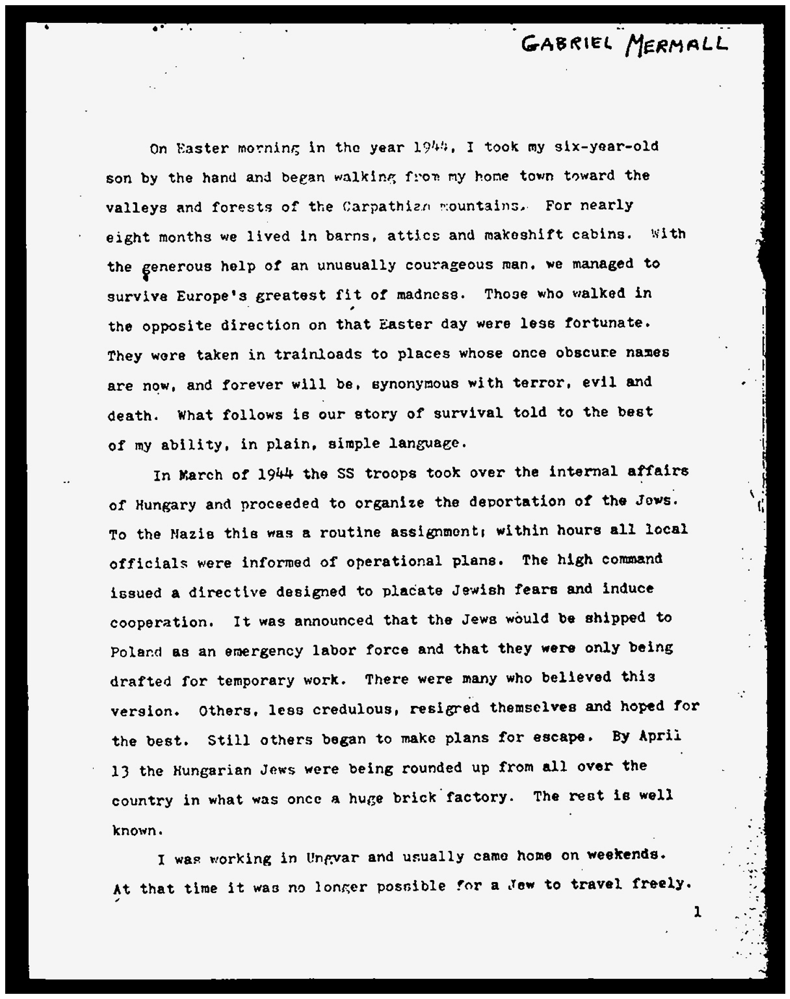

In [7]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.zeros((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)
eroded_image = thin_font(no_noise)
cv2.imwrite("temp/eroded_image.jpg", eroded_image)
display("temp/eroded_image.jpg")

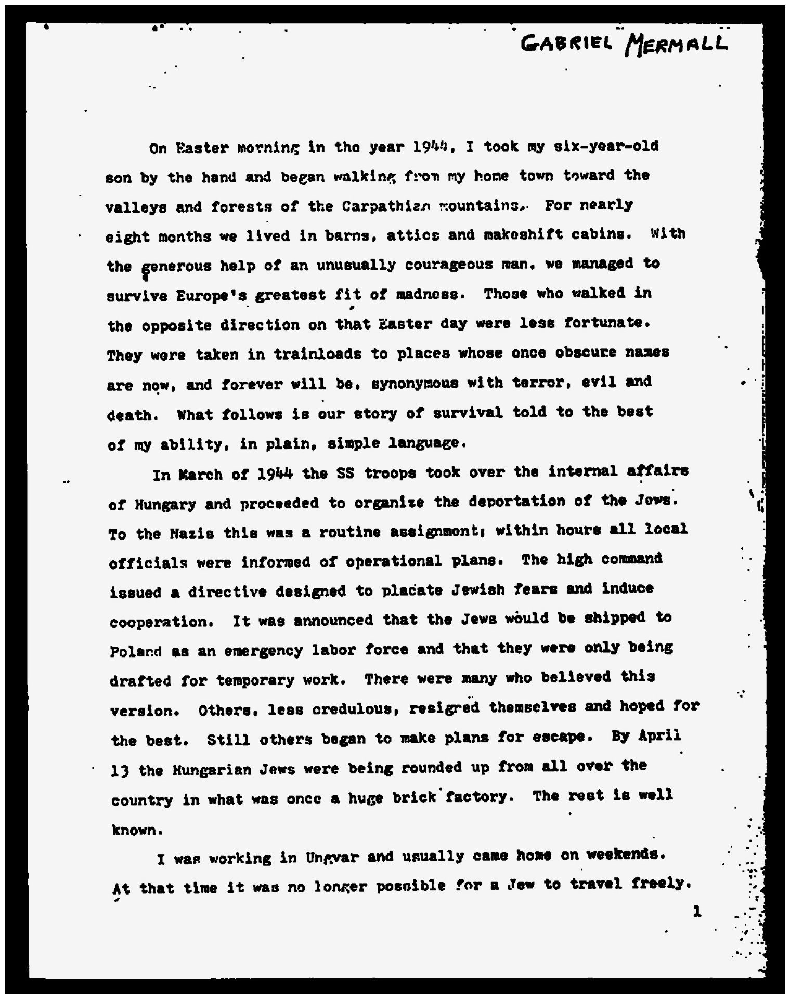

In [8]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

dilated_image = thick_font(no_noise)
cv2.imwrite("temp/dilated_image.jpg", dilated_image)
display("temp/dilated_image.jpg")


# Rotation / Deskewing

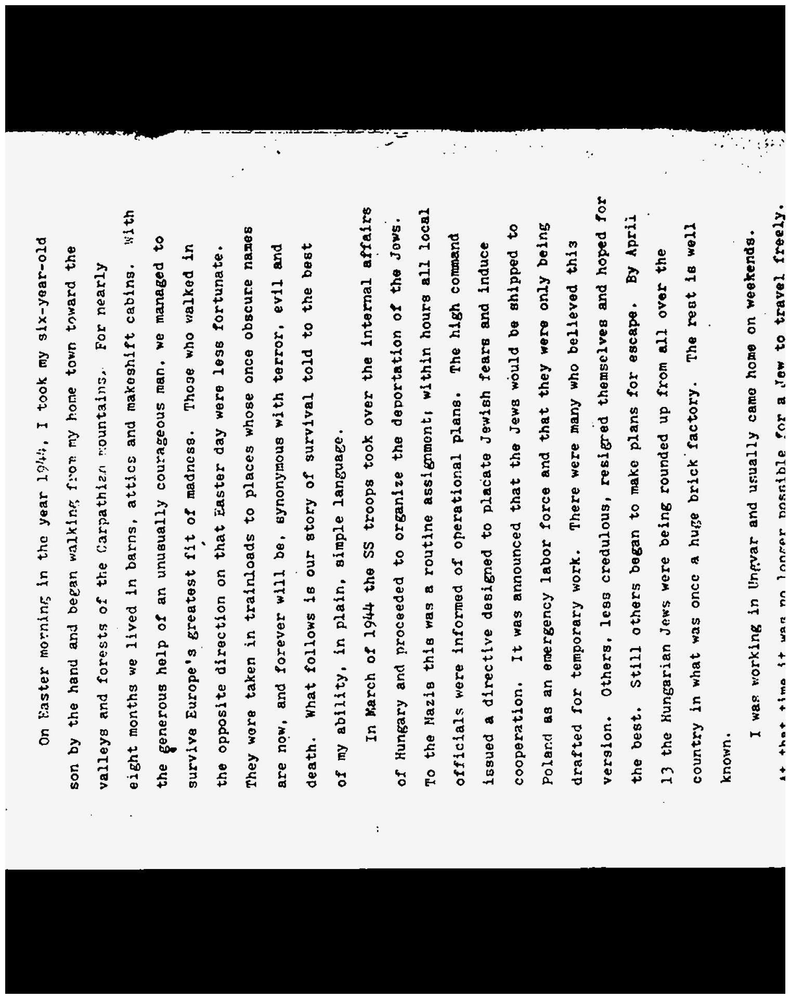

In [9]:
import cv2
import numpy as np

def rotate_to_correct_orientation(cvImage):
    angle = getSkewAngle(cvImage)
    rotated = rotateImage(cvImage, -angle)
    
    # Further fine-tuning might be necessary based on your specific images
    
    return rotated

def getSkewAngle(cvImage) -> float:
    newImage = cvImage.copy()
    blur = cv2.GaussianBlur(newImage, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        raise ValueError("No contours found!")

    contours = sorted(contours, key=cv2.contourArea, reverse=True)
    largestContour = contours[0]

    minAreaRect = cv2.minAreaRect(largestContour)
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle

    return -angle

def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

# Example usage:
# cvImage = cv2.imread("path_to_your_image.jpg")
rotated_corrected = rotate_to_correct_orientation(no_noise)
cv2.imwrite("temp/rotated_corrected.jpg", rotated_corrected)
display("temp/rotated_corrected.jpg")


# Removing Borders

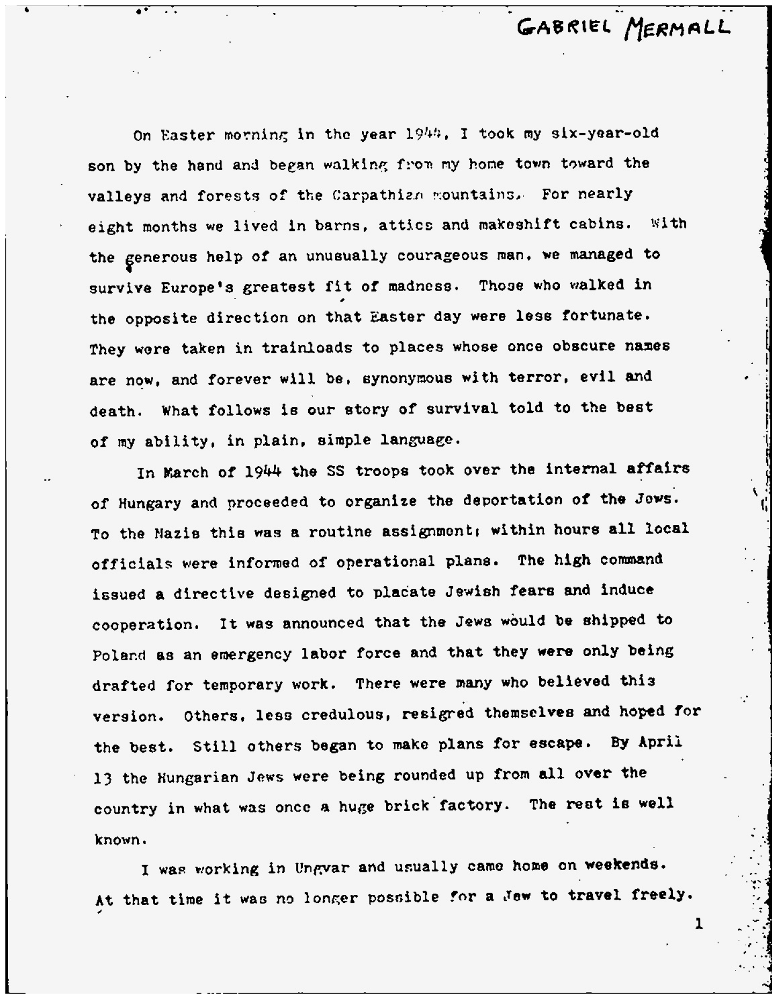

In [10]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

no_borders = remove_borders(no_noise)
cv2.imwrite("temp/no_borders.jpg", no_borders)
display('temp/no_borders.jpg')

# Adding Borders

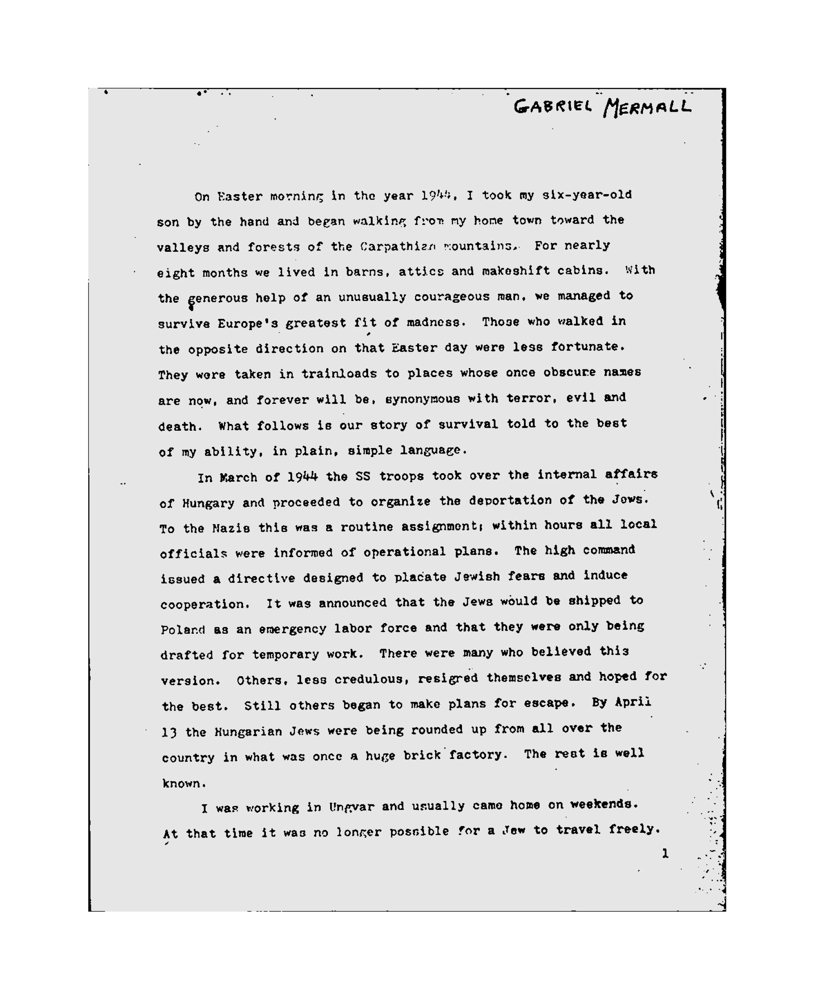

In [11]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_border.jpg", image_with_border)
display("temp/image_with_border.jpg")